In [2]:
import random
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dataset
import torchvision.utils as vutils
import torchvision.transforms as transforms
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

manualSeed = 900
random.seed(manualSeed)
torch.manual_seed(manualSeed)
torch.use_deterministic_algorithms(True)

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [4]:
! unzip '/content/drive/MyDrive/Dataset/archive (3).zip'

Streaming output truncated to the last 5000 lines.
  inflating: img_align_celeba/img_align_celeba/197604.jpg  
  inflating: img_align_celeba/img_align_celeba/197605.jpg  
  inflating: img_align_celeba/img_align_celeba/197606.jpg  
  inflating: img_align_celeba/img_align_celeba/197607.jpg  
  inflating: img_align_celeba/img_align_celeba/197608.jpg  
  inflating: img_align_celeba/img_align_celeba/197609.jpg  
  inflating: img_align_celeba/img_align_celeba/197610.jpg  
  inflating: img_align_celeba/img_align_celeba/197611.jpg  
  inflating: img_align_celeba/img_align_celeba/197612.jpg  
  inflating: img_align_celeba/img_align_celeba/197613.jpg  
  inflating: img_align_celeba/img_align_celeba/197614.jpg  
  inflating: img_align_celeba/img_align_celeba/197615.jpg  
  inflating: img_align_celeba/img_align_celeba/197616.jpg  
  inflating: img_align_celeba/img_align_celeba/197617.jpg  
  inflating: img_align_celeba/img_align_celeba/197618.jpg  
  inflating: img_align_celeba/img_align_celeba/19

In [5]:
dataroot = "/content/img_align_celeba"
num_workers = 2
batch_size = 128
img_size = 64
nc = 3
nz = 100
ngf = 64
ndf = 64
num_epochs = 3
learning_rate = 0.0002
beta1 = 0.9
ngpu = 1
eps = 1e-5

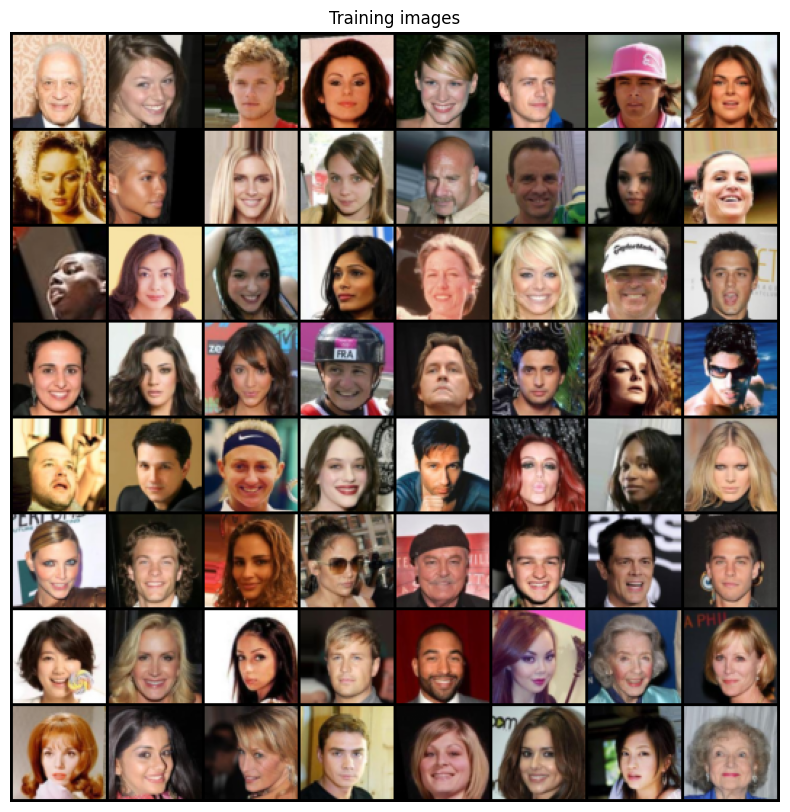

In [6]:
ds = dataset.ImageFolder(root=dataroot,
                         transform=transforms.Compose([
                            transforms.Resize(img_size),
                            transforms.CenterCrop(img_size),
                            transforms.ToTensor(),
                            transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
                            ]))
dataloader = torch.utils.data.DataLoader(ds, batch_size=batch_size, shuffle=True, num_workers=num_workers)
device = torch.device("cuda:0" if (torch.cuda.is_available() and ngpu>0) else "cpu")

real_batch = next(iter(dataloader))
plt.figure(figsize=(10, 10))
plt.axis("off")
plt.title("Training images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=2, normalize=True).cpu(), (1, 2, 0)))

In [7]:
def init_weights(m):
  classname = m.__class__.__name__
  if classname.find('Conv') != -1:
    nn.init.normal_(m.weight.data, 0.0, 0.02)
  elif classname.find('BatchNorm') != -1:
    nn.init.normal_(m.weight.data, 1.0, 0.02)
    nn.init.constant_(m.bias.data, 0)

In [8]:
class Generator(nn.Module):
  def __init__(self, ngpu):
    super(Generator,self).__init__()
    self.ngpu = ngpu
    self.main = nn.Sequential(

        nn.ConvTranspose2d(nz, ngf*8, 4, 1, 0, bias=False),
        nn.BatchNorm2d(ngf*8),
        nn.ReLU(True),

        nn.ConvTranspose2d(ngf*8, ngf*4, 4, 2, 1, bias=False),
        nn.BatchNorm2d(ngf*4),
        nn.ReLU(True),

        nn.ConvTranspose2d(ngf*4, ngf*2, 4, 2, 1, bias=False),
        nn.BatchNorm2d(ngf*2),
        nn.ReLU(True),

        nn.ConvTranspose2d(ngf*2, ngf, 4, 2, 1, bias=False),
        nn.BatchNorm2d(ngf),
        nn.ReLU(True),

        nn.ConvTranspose2d(ngf, nc, 4, 2, 1, bias=False),
        nn.Tanh()
    )

  def forward(self, inputs):
    return self.main(inputs)

In [9]:
gen_model = Generator(ngpu).to(device)
if (device.type == 'cuda') and (ngpu>1):
  gen_model = nn.DataParallel(gen_model, list(range(ngpu)))

gen_model.apply(init_weights)
print(gen_model)

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)


In [10]:
class Discriminator(nn.Module):
  def __init__(self, ngpu):
    super(Discriminator, self).__init__()
    self.ngpu = ngpu
    self.main = nn.Sequential(

        nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
        nn.LeakyReLU(0.2, inplace=True),

        nn.Conv2d(ndf, ndf*2, 4, 2, 1, bias=False),
        nn.BatchNorm2d(ndf*2),
        nn.LeakyReLU(0.2, inplace=True),

        nn.Conv2d(ndf*2, ndf*4, 4, 2, 1, bias=False),
        nn.BatchNorm2d(ndf*4),
        nn.LeakyReLU(0.2, inplace=True),

        nn.Conv2d(ndf*4, ndf*8, 4, 2, 1, bias=False),
        nn.BatchNorm2d(ndf*8),
        nn.LeakyReLU(0.2, inplace=True),

        nn.Conv2d(ndf*8, 1, 4, 1, 0, bias=False),
        nn.Sigmoid()

    )

  def forward(self, inputs):
    return self.main(inputs)


In [11]:
dis_model = Discriminator(ngpu).to(device)
if (device.type == 'cuda') and (ngpu>1):
  dis_model = nn.DataParallel(dis_model, list(range(ngpu)))

dis_model.apply(init_weights)
print(dis_model)

Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)


In [12]:
criterion = nn.BCELoss()
fixed_noise = torch.randn(64, nz, 1, 1, device=device)

real_label = 1
fake_label = 0

optimizerG = optim.Adam(gen_model.parameters(), lr=learning_rate, betas=(beta1, 0.999))
optimizerD = optim.Adam(dis_model.parameters(), lr=learning_rate, betas=(beta1, 0.999))

In [13]:
img_list=[]
G_loss=[]
D_loss=[]
iter=0

for epoch in range(num_epochs):
  for i, data in enumerate(dataloader):

    dis_model.zero_grad()
    real_cpu = data[0].to(device)
    b_size = real_cpu.size(0)
    label = torch.full((b_size,), real_label, dtype=torch.float, device=device)
    output = dis_model(real_cpu).view(-1)
    errD_real = criterion(output, label)
    errD_real.backward()
    D_x = output.mean().item()


    gen_model.zero_grad()
    noise = torch.randn(b_size, nz, 1, 1, device=device)
    fake = gen_model(noise)
    label.fill_(fake_label)
    output = dis_model(fake.detach()).view(-1)
    errD_fake = criterion(output, label)
    errD_fake.backward()
    D_G_z1 = output.mean().item()
    errD = errD_real + errD_fake
    optimizerD.step()

    # gen_model.zero_grad()
    label.fill_(real_label)
    output = dis_model(fake).view(-1)
    errG = criterion(output, label)
    errG.backward()
    D_G_z2 = output.mean().item()
    optimizerG.step()

    if i % 50 == 0:
      print('[%d/%d] [%d/%d] \tLoss_D: %4f \tLoss_G: %4f \tD(x): %4f \tD(G(z)): %4f/%4f'
      %(epoch, num_epochs, i, len(dataloader), errD.item(), errG.item(), D_x, D_G_z1, (D_G_z2+eps)))

    D_loss.append(errD.item())
    G_loss.append(errG.item())

    if (iter%500==0) or (epoch == (num_epochs)-1 and i == len(dataloader)-1):
      with torch.no_grad():
        fake = gen_model(fixed_noise).detach().cpu()
      img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

    iter+=1




[0/3] [0/1583] 	Loss_D: 1.534445 	Loss_G: 3.445538 	D(x): 0.430565 	D(G(z)): 0.368457/0.043065
[0/3] [50/1583] 	Loss_D: 0.051139 	Loss_G: 13.107411 	D(x): 0.980059 	D(G(z)): 0.021245/0.000012
[0/3] [100/1583] 	Loss_D: 0.038346 	Loss_G: 11.521606 	D(x): 0.983567 	D(G(z)): 0.009934/0.000023
[0/3] [150/1583] 	Loss_D: 0.040029 	Loss_G: 11.265045 	D(x): 0.987942 	D(G(z)): 0.004993/0.000025
[0/3] [200/1583] 	Loss_D: 0.012089 	Loss_G: 9.613344 	D(x): 0.995395 	D(G(z)): 0.006233/0.000098
[0/3] [250/1583] 	Loss_D: 0.026903 	Loss_G: 11.650225 	D(x): 0.996968 	D(G(z)): 0.022502/0.000051
[0/3] [300/1583] 	Loss_D: 0.031433 	Loss_G: 7.281480 	D(x): 0.991719 	D(G(z)): 0.007505/0.001498
[0/3] [350/1583] 	Loss_D: 0.013320 	Loss_G: 14.024607 	D(x): 0.993137 	D(G(z)): 0.000165/0.000017
[0/3] [400/1583] 	Loss_D: 0.010931 	Loss_G: 9.674985 	D(x): 0.999323 	D(G(z)): 0.010011/0.000301
[0/3] [450/1583] 	Loss_D: 0.012501 	Loss_G: 11.591948 	D(x): 0.996666 	D(G(z)): 0.008669/0.000096
[0/3] [500/1583] 	Loss_D: 0

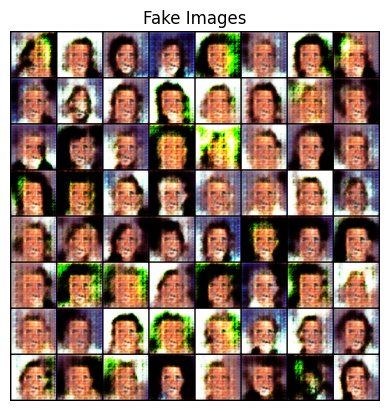

In [16]:
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(img_list[-1], (1, 2, 0)))
# The faces actually seem quite bad, I tried tweaking the number of epochs a little bit.
# I have limited the number of epochs to 3, I feel running it for more epochs will improve the quality

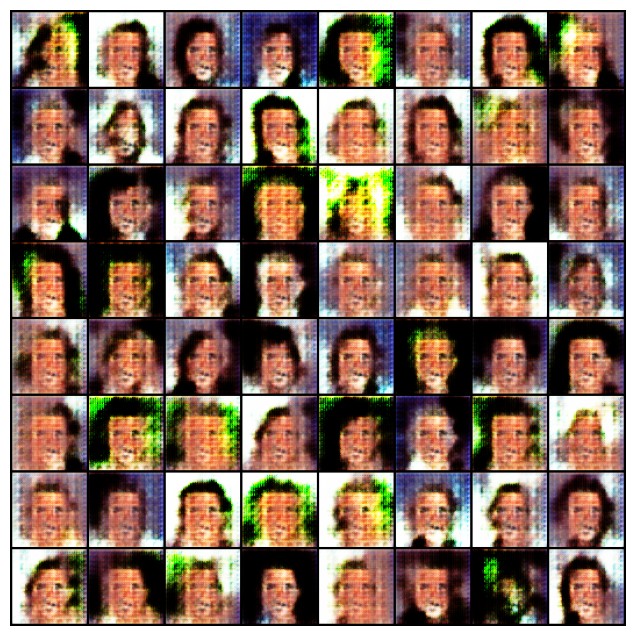

In [17]:
fig = plt.figure(figsize=(8, 8))
plt.axis("off")
imgs = [[plt.imshow(np.transpose(i, (1, 2, 0)), animated = True)] for i in img_list]
anim = animation.ArtistAnimation(fig, imgs, interval=1000, repeat_delay=1000, blit=True)

HTML(anim.to_jshtml())

# plt.show()

In [ ]:
print(len(dataloader))